# EEG Signal Processing
We are using OpenBCI Cython board with 4 EEG channels.

## Step 1. Import libraries
First, allow matplotlib figures to be printed in the notebook. Do pip install matplotlib if you haven't yet.

In [1]:
%matplotlib inline
#%matplotlib notebooks
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d import Axes3D

Then import mpld3 package (installed before using pip install mpld3 in the terminal inside virtualenv.
mpld3 package enables zoom in inline jupyter figures.

In [2]:
import mpld3
mpld3.enable_notebook()

Import also pandas, numpy and scipy.fftpack. As before, install it in the virtualenv before, using pip

In [3]:
import pandas as pd
import numpy as np
import scipy.fftpack

## Step 2. Import csv file with the EEG recording
Important info about cython csv data file columns:
- time [milliseconds]: Time is given by the macbook clock, not the cython clock, so it is not accurate because it timestamps when receives the packet, not at the time that the record was made. The first value of Time is valuable to know when the experiment starts, and after that, for each sample you should add the time corresponding to the sampling period. Knowing that the sampling frequency of the cython board is fs = 200Hz, which means that in 1 second, 200 samples are recorded; or that a sample is being recorded every 0.005 seconds (Ts = 1/fs = 1/200 = 0.005 s). This is of course an estimation due to the jitter/drift of the cython board recording, but is good enough.
- timeFormatted [hh:mm:ss.sss]: Same as above with formatted time. A converter tool from timestamp to Date can be found in the link: https://www.timestampconvert.com/?go2=true&offset=-2&timestamp=1559752708356&Submit=++++++Convert+to+Date++++++

- Channels: The values in the channels are in microVolts. 1 microVolt = 1e-6 V
- Accelerometer: accelerometer data is in "G"

Sensors position: o1 o2 f3 f4
- Channel 1: f4 - front right
- Channel 2: f3 - front left
- Channel 3: o1 - back left
- Channel 4: o2 - back right


More info:
About data format: https://openbci.com/forum/index.php?p=/discussion/644/interpretation-of-openbci-data-files-edf-conversion
About timestamps: http://openbci.com/forum/index.php?p=/discussion/1953/un-stable-timestamps-in-txt-file-created-by-the-openbci-gui

In [17]:
data = pd.read_csv('..\data\OpenBCISession_eye_blink_test\OpenBCI-RAW-2020-03-14_13-02-53.txt',
                   header = 5,
                   names = ['sampleIdx','ch1','ch2','ch3','ch4','accel1','accel2','accel3','timeFormatted','time'])

# at the moment, timeFormatted is not important and is not well formatted, 
# as well as sampleIdx and accelerometer data, so we can delete it.
data = data.drop(["sampleIdx","timeFormatted", "accel1", "accel2", "accel3"],axis=1)

# reorder dataframe
data = data[['time', 'ch1', 'ch2', 'ch3', 'ch4']]

# number of samples
N = len(data['time']) 

# sampling frequency (Hz)
fs = 200.0 

# sampling period (seconds)
T = 1.0 / fs 

data.loc[0:9]

,time,ch1,ch2,ch3,ch4
0,1584187373038,-212.23,237.44,-94.22,149.50
1,1584187373063,-217.65,249.40,-91.22,168.56
2,1584187373064,-213.71,249.92,-97.58,168.52
3,1584187373064,-211.47,252.79,-99.63,148.31
4,1584187373064,-220.86,244.48,-93.19,138.94
5,1584187373064,-209.28,255.06,-84.68,154.33
6,1584187373064,-206.80,253.76,-87.73,152.61
7,1584187373078,-210.46,253.58,-87.92,134.10
8,1584187373078,-206.80,255.60,-73.59,136.11
9,1584187373092,-208.48,266.69,-70.51,152.10


## Step 3. Data cleaning
As said before, time has to be changed by a vector with the lenght of data. Time vector should be [0, 0.005, 0.010, 0.015, ...]. It can start from zero (if doesn't matter the starting time) or from starting time by using startFromZero boolean variable.

In [24]:
from datetime import datetime, timedelta

startTime = (data['time'].loc[0]).astype(np.float64)
stopTime = (startTime + N*T)
time = np.linspace(startTime, stopTime, N)
time = np.around(time, decimals=3)

startFromZero = True

if (startFromZero):
    time = time - round(startTime,3)
    time = np.around(time, decimals=3)
    data['time'] = time
    #timeFormatted = datetime.fromtimestamp(time / 1000).strftime('%H:%M:%S.%f')
    # rawData['timeFormatted'] = timeFormatted
else:
    data['time'] = time

# Print first 2 samples
data.loc[0:3]

,time,ch1,ch2,ch3,ch4
0,0.000,-212.23,237.44,-94.22,149.50
1,0.005,-217.65,249.40,-91.22,168.56
2,0.010,-213.71,249.92,-97.58,168.52
3,0.015,-211.47,252.79,-99.63,148.31


Ok, now time looks good! Let's plot channels data to check how it looks.

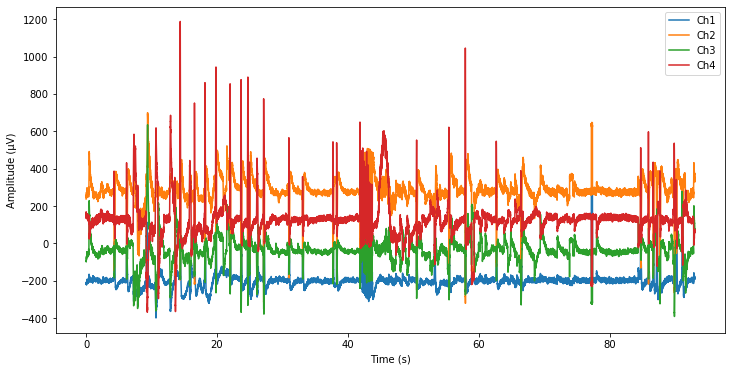

In [32]:

plt.figure(figsize=(12, 6))
plt.plot(data['time'], data['ch1'])
plt.plot(data['time'], data['ch2'])
plt.plot(data['time'], data['ch3'])
plt.plot(data['time'], data['ch4'])
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')
plt.legend(['Ch1','Ch2','Ch3','Ch4'])
plt.show()

From the plot above, we can appreciate 2 things:
1. After 100 seconds, the recording seems to have abnormal functioning, probably caused by noise (touching the sensor, the cables, etc.). This can be deleted and get the first 90 seconds. As we know from the testing notes that the relevant data is between 19 and 54 seconds, we will select this part. 

In [8]:
#data = data[(data['time']>19) & (data['time']<54) ]

2. All the signals have a constant mean, but different from zero. This is caused by the DC component (0Hz), so we will need a filter that removes the DC component.

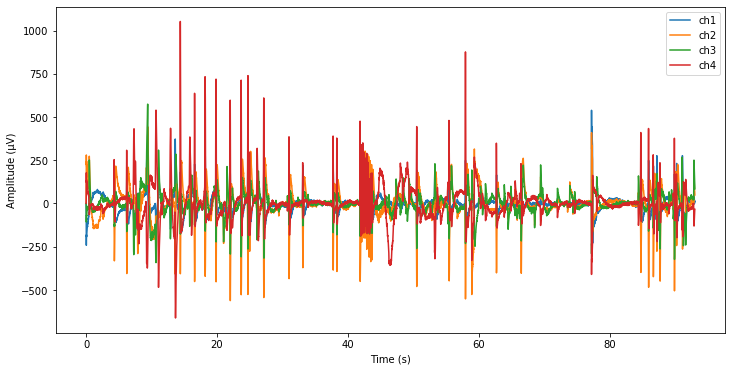

In [39]:
# Required input defintions are as follows;
# time:   Time between samples
# band:   The bandwidth around the centerline freqency that you wish to filter
# freq:   The centerline frequency to be filtered
# ripple: The maximum passband ripple that is allowed in db
# order:  The filter order.  For FIR notch filters this is best set to 2 or 3,
#         IIR filters are best suited for high values of order.  This algorithm
#         is hard coded to FIR filters
# filter_type: 'butter', 'bessel', 'cheby1', 'cheby2', 'ellip'
# data:         the data to be filtered
from scipy.signal import iirfilter, butter, lfilter
def notch_filter(fs, band, freq, ripple, order, filter_type, data):
    from scipy.signal import iirfilter, lfilter
    nyq  = fs/2.0
    low  = freq - band/2.0
    high = freq + band/2.0
    low  = low/nyq
    high = high/nyq
    b, a = iirfilter(order, [low, high], rp=ripple, btype='bandstop',
                     analog=False, ftype=filter_type)
    filtered_data = lfilter(b, a, data)
    return filtered_data

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):

    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

#filtData = notch_filter(200.0, 1.0, 50.0, 0.5, 2.0, 'butter', data['ch3'])
filtData = pd.DataFrame()
filtData['time'] = data['time']
filtData['ch1'] = butter_bandpass_filter(data['ch1'],0.1,30.0,200)
filtData['ch1'] = notch_filter(200.0, 0.1, 50.0, 0.5, 2.0, 'butter', filtData['ch1'])
filtData['ch2'] = butter_bandpass_filter(data['ch2'],0.1,30.0,200)
filtData['ch2'] = notch_filter(200.0, 0.1, 50.0, 0.5, 2.0, 'butter', filtData['ch2'])
filtData['ch3'] = butter_bandpass_filter(data['ch3'],0.1,30.0,200)
filtData['ch3'] = notch_filter(200.0, 0.1, 50.0, 0.5, 2.0, 'butter', filtData['ch3'])
filtData['ch4'] = butter_bandpass_filter(data['ch4'],0.1,30.0,200)
filtData['ch4'] = notch_filter(200.0, 0.1, 50.0, 0.5, 2.0, 'butter', filtData['ch4'])

plt.figure(figsize=(12, 6))

#plt.subplot(2, 2, 1)
#plt.plot(data['time'], data['ch1'])
#plt.plot(data['time'], data['ch2'])
#plt.plot(data['time'], data['ch3']-200)
#plt.plot(data['time'], data['ch4']-200)


#plt.subplot(2, 2, 2)
plt.plot(filtData['time'], filtData['ch1'], label='ch1')
plt.plot(filtData['time'], filtData['ch2'], label='ch2')
plt.plot(filtData['time'], filtData['ch3'], label='ch3')
plt.plot(filtData['time'], filtData['ch4'], label='ch4')

#plt.plot(filtData['time'], filtData['ch2'])
#plt.subplot(4, 1, 3)
#plt.plot(filtData['time'], filtData['ch3'])
#plt.subplot(4, 1, 4)
#plt.plot(filtData['time'], filtData['ch4'])
ax = plt.gca()
ax.legend()
#ax.set_ylim(-75,75)
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')
plt.show()

# Correlation
Correlation between all channels let us know how similar channels are. From results, ch1 and ch4 have a quite high correlation, correlation > 0.75. Also interesting the complete lack of correlation between channel 2 and channel 3, where correlation = 0.02

In [40]:
correlation = filtData[['ch1','ch2','ch3','ch4']].corr(method ='pearson')
correlation

,ch1,ch2,ch3,ch4
ch1,1.000000,-0.576910,-0.054742,0.025864
ch2,-0.576910,1.000000,0.515097,-0.327157
ch3,-0.054742,0.515097,1.000000,-0.579122
ch4,0.025864,-0.327157,-0.579122,1.000000


In [58]:
fs = 200.0
T = 1.0 / fs
NFFT = 200
N = len(filtData['ch1']) #same for all channels
print(scipy.__version__)
print(pd.__version__)
#plt.psd(filtData['ch1'], NFFT=NFFT, pad_to=NFFT, Fs=fs)
#plt.psd(filtData['ch2'], NFFT=NFFT, pad_to=NFFT, Fs=fs)
#plt.psd(filtData['ch3'], NFFT=NFFT, pad_to=NFFT, Fs=fs)
#plt.psd(filtData['ch4'], NFFT=NFFT, pad_to=NFFT, Fs=fs)

1.4.1
1.0.1


In [56]:
scipy.fftpack.fft(filtData['ch1'])

AttributeError: 'Series' object has no attribute 'flags'

In [52]:
fs = 200.0
T = 1.0 / fs
N = len(filtData['ch1']) #same for all channels

def fft(data, fs):
    N = len(data)
    fs = 200.0 #Hz, ganglion sampling freq
    # sample spacing
    T = 1.0 / fs
    x = np.linspace(0.0, N*T, N)
    fftdata = scipy.fftpack.fft(data)
    fftdata = 2.0/N * np.abs(fftdata[:N//2])
    # xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    return fftdata

def plotfft(x, y):
    N = len(y)
    fig, ax = plt.subplots()
    # ax.plot(x, 2.0/N * np.abs(y[:N//2]))
    ax.plot(x,y)
    plt.ylabel('Amplitude')
    plt.xlabel('Freq (Hz)')
    plt.show()

freqfft = np.linspace(0.0, 1.0/(2.0*T), N//2)
fftData = pd.DataFrame({'freq': freqfft, 'ch1': fft(filtData['ch1'], fs), 'ch2': fft(filtData['ch2'], fs), 'ch3': fft(filtData['ch3'], fs), 'ch4': fft(filtData['ch4'], fs)})

plt.figure(figsize=(12, 6))
plt.plot(fftData['freq'], fftData['ch1'])
plt.plot(fftData['freq'], fftData['ch2'])
plt.plot(fftData['freq'], fftData['ch3'])
plt.plot(fftData['freq'], fftData['ch4'])
ax = plt.gca()
ax.set_xlim(0,50)
plt.ylabel('Amplitude')
plt.xlabel('Freq (Hz)')
plt.show()

AttributeError: 'Series' object has no attribute 'flags'

## EEG wave frequencies
Channel descomposition in delta, tetha, alpha and beta signals.
- Delta 0-4 Hz
- Theta 4-8 Hz
- Alpha 8-13 Hz
- Beta 13+ Hz
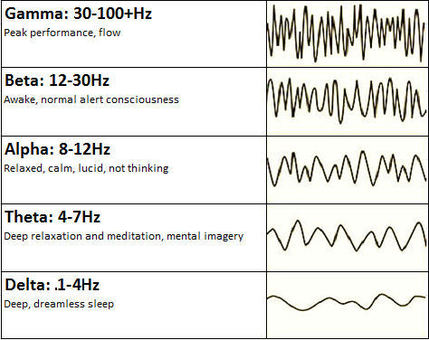

Text(0.5, 0, 'Time (s)')

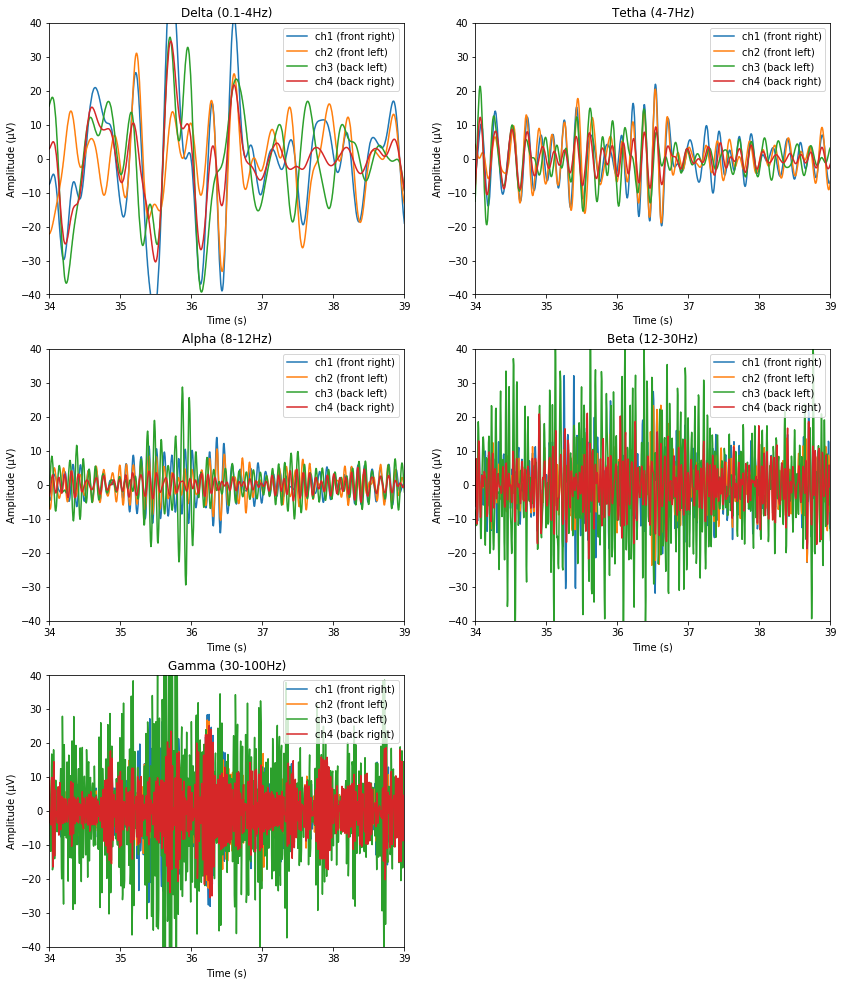

In [17]:
filtData['ch1_delta'] = butter_bandpass_filter(filtData['ch1'],1,4,200)
filtData['ch2_delta'] = butter_bandpass_filter(filtData['ch2'],1,4,200)
filtData['ch3_delta'] = butter_bandpass_filter(filtData['ch3'],1,4,200)
filtData['ch4_delta'] = butter_bandpass_filter(filtData['ch4'],1,4,200)

filtData['ch1_tetha'] = butter_bandpass_filter(filtData['ch1'],4,7,200)
filtData['ch2_tetha'] = butter_bandpass_filter(filtData['ch2'],4,7,200)
filtData['ch3_tetha'] = butter_bandpass_filter(filtData['ch3'],4,7,200)
filtData['ch4_tetha'] = butter_bandpass_filter(filtData['ch4'],4,7,200)

filtData['ch1_alpha'] = butter_bandpass_filter(filtData['ch1'],8,12,200)
filtData['ch2_alpha'] = butter_bandpass_filter(filtData['ch2'],8,12,200)
filtData['ch3_alpha'] = butter_bandpass_filter(filtData['ch3'],8,12,200)
filtData['ch4_alpha'] = butter_bandpass_filter(filtData['ch4'],8,12,200)


filtData['ch1_beta'] = butter_bandpass_filter(filtData['ch1'],12,30,200)
filtData['ch2_beta'] = butter_bandpass_filter(filtData['ch2'],12,30,200)
filtData['ch3_beta'] = butter_bandpass_filter(filtData['ch3'],12,30,200)
filtData['ch4_beta'] = butter_bandpass_filter(filtData['ch4'],12,30,200)


filtData['ch1_gamma'] = butter_bandpass_filter(filtData['ch1'],30,46,200)
filtData['ch2_gamma'] = butter_bandpass_filter(filtData['ch2'],30,46,200)
filtData['ch3_gamma'] = butter_bandpass_filter(filtData['ch3'],30,46,200)
filtData['ch4_gamma'] = butter_bandpass_filter(filtData['ch4'],30,46,200)


start = 34
stop = 39

plt.figure(figsize=(14, 17))

# deltas
plt.subplot(321)
plt.plot(filtData['time'], filtData['ch1_delta'], label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_delta'], label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_delta'], label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_delta'], label='ch4 (back right)')
plt.title('Delta (0.1-4Hz)')
ax = plt.gca()
ax.set_ylim(-40,40)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')

# Tethas
plt.subplot(322)
plt.plot(filtData['time'], filtData['ch1_tetha'], label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_tetha'], label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_tetha'], label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_tetha'], label='ch4 (back right)')
plt.title('Tetha (4-7Hz)')
ax = plt.gca()
ax.set_ylim(-40,40)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')

# Alphas
plt.subplot(323)
plt.plot(filtData['time'], filtData['ch1_alpha'], label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_alpha'], label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_alpha'], label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_alpha'], label='ch4 (back right)')
plt.title('Alpha (8-12Hz)')
ax = plt.gca()
ax.set_ylim(-40,40)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')

# Betas
plt.subplot(324)
plt.plot(filtData['time'], filtData['ch1_beta'], label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_beta'], label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_beta'], label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_beta'], label='ch4 (back right)')
plt.title('Beta (12-30Hz)')
ax = plt.gca()
ax.set_ylim(-40,40)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')

# Gammas
plt.subplot(325)
plt.plot(filtData['time'], filtData['ch1_gamma'], label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_gamma'], label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_gamma'], label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_gamma'], label='ch4 (back right)')
plt.title('Gamma (30-100Hz)')
ax = plt.gca()
ax.set_ylim(-40,40)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')

Knowing that:
- Channel 1: f4 - front right
- Channel 2: f3 - front left
- Channel 3: o1 - back left
- Channel 4: o2 - back right
We can see a firing at 20.6 seconds in channel 2 (frontal left)

interesting the testing notes here: 

19s - 54s: Recordar nombre y dirección
Memoria de trabajo y recuerdo inmediato
34s. Cris termina de hablar:


40s. Natalia se equivoca
41s. Natalia acierta
42s. Natalia dice un : No sé qué


Text(0.5, 0, 'Time (s)')

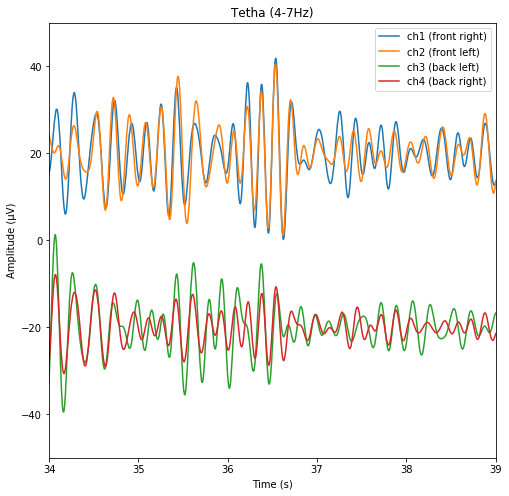

In [18]:
# Tethas comparison per channel
plt.figure(figsize=(8, 8))
plt.plot()
plt.plot(filtData['time'], filtData['ch1_tetha']+20, label='ch1 (front right)')
plt.plot(filtData['time'], filtData['ch2_tetha']+20, label='ch2 (front left)')
plt.plot(filtData['time'], filtData['ch3_tetha']-20, label='ch3 (back left)')
plt.plot(filtData['time'], filtData['ch4_tetha']-20, label='ch4 (back right)')
plt.title('Tetha (4-7Hz)')
ax = plt.gca()
ax.set_ylim(-50,50)
ax.set_xlim(start,stop)
ax.legend()
plt.ylabel('Amplitude (\u03BCV)')
plt.xlabel('Time (s)')


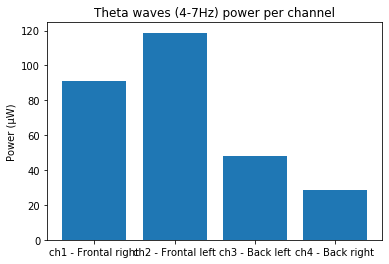

In [14]:
def power(x):
    return sum(x*x)/len(x)

power_ch1_theta = power(filtData['ch1_tetha'])
power_ch2_theta = power(filtData['ch2_tetha'])
power_ch3_theta = power(filtData['ch3_tetha'])
power_ch4_theta = power(filtData['ch4_tetha'])
plt.bar([0,1,2,3], [power_ch1_theta, power_ch2_theta, power_ch3_theta, power_ch4_theta])
plt.xticks([0,1,2,3], ('ch1 - Frontal right', 'ch2 - Frontal left', 'ch3 - Back left', 'ch4 - Back right'))
plt.ylabel('Power (\u03BCW)')
plt.title('Theta waves (4-7Hz) power per channel')
plt.show()


Checking the power of all channels, we can see that Tetha (associated with memory) is very active in frontal part compared to back part; specially in the frontal left (channel 2) that has > 118 microW

Power of channels: Lets check the power for all the channels in general, and let's see which part of the brain is associated with memory.

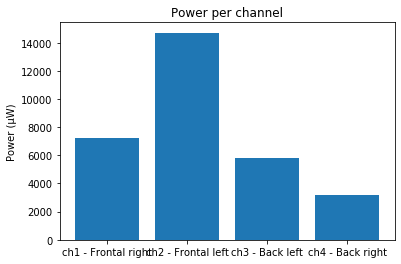

In [15]:
power_ch1 = power(filtData['ch1'])
power_ch2 = power(filtData['ch2'])
power_ch3 = power(filtData['ch3'])
power_ch4 = power(filtData['ch4'])
plt.bar([0,1,2,3], [power_ch1, power_ch2, power_ch3, power_ch4])
plt.xticks([0,1,2,3], ('ch1 - Frontal right', 'ch2 - Frontal left', 'ch3 - Back left', 'ch4 - Back right'))
plt.ylabel('Power (\u03BCW)')
plt.title('Power per channel')
plt.show()

Looks good. Frontal left part seems to have something to do with memory.

### Music with the brain

In [19]:
from IPython.display import Audio, display, clear_output
from ipywidgets import widgets
from functools import partial

Audio(filtData['ch2_tetha'], rate=200, autoplay=True)

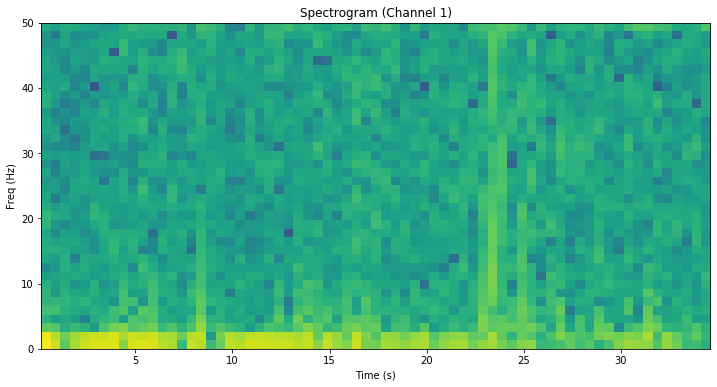

In [16]:
NFFT = 150 #window
fs = 200
plt.figure(figsize=(12, 6))
plt.specgram(filtData['ch1'], NFFT=NFFT, Fs=fs, noverlap=50)
ax = plt.gca()
ax.set_ylim(0,50)
plt.title('Spectrogram (Channel 1)')
plt.xlabel('Time (s)')
plt.ylabel('Freq (Hz)')
plt.show()


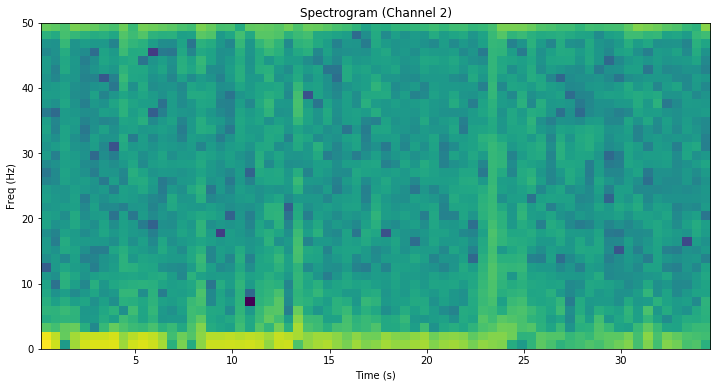

In [17]:
plt.figure(figsize=(12, 6))
plt.specgram(filtData['ch2'], NFFT=NFFT, Fs=fs, noverlap=50)
ax = plt.gca()
ax.set_ylim(0,50)
plt.title('Spectrogram (Channel 2)')
plt.xlabel('Time (s)')
plt.ylabel('Freq (Hz)')
plt.show()

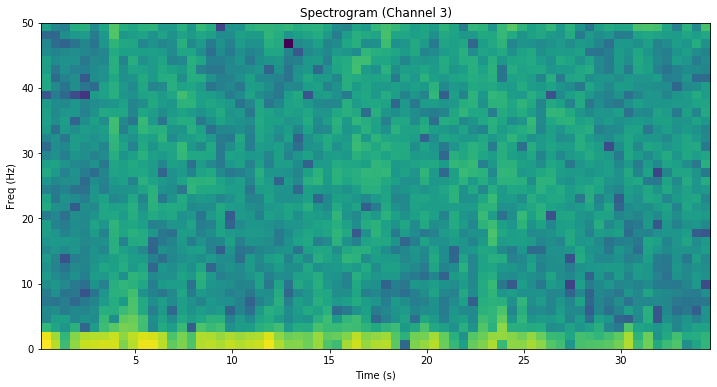

In [18]:
plt.figure(figsize=(12, 6))
plt.specgram(filtData['ch3'], NFFT=NFFT, Fs=fs, noverlap=50)
ax = plt.gca()
ax.set_ylim(0,50)
plt.title('Spectrogram (Channel 3)')
plt.xlabel('Time (s)')
plt.ylabel('Freq (Hz)')
plt.show()

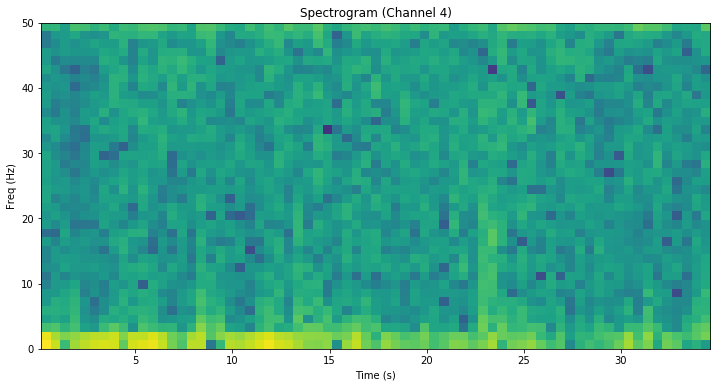

In [19]:
plt.figure(figsize=(12, 6))
plt.specgram(filtData['ch4'], NFFT=NFFT, Fs=fs, noverlap=50)
ax = plt.gca()
ax.set_ylim(0,50)
plt.title('Spectrogram (Channel 4)')
plt.xlabel('Time (s)')
plt.ylabel('Freq (Hz)')
plt.show()

ValueError: x and y must be equal-length 1-D arrays

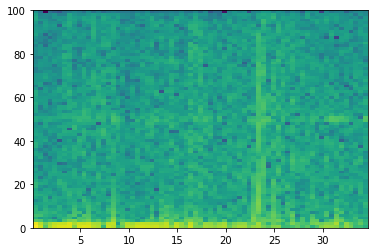

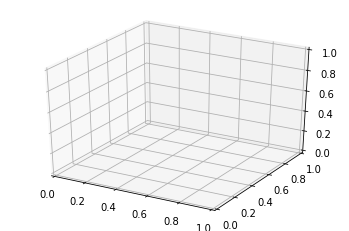

In [20]:
Pxx, freqs, bins, im = plt.specgram(filtData['ch1'], NFFT=NFFT, Fs=fs, noverlap=50)

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_trisurf(Pxx, freqs, bins)
ax.plot_surface(Pxx, freqs, bins)

ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()